# Week 3 Assignment

Author: Victor Tran

For our group project, we are interested in looking at patterns of racial and socioeconomic segregation in the city of Los Angeles, and how patterns of housing development (both market rate and affordable housing), resource distribution, and other factors represent these disparities and can serve to reinforce and perpetuate them. In this individual assignment, I will be exploring the census variables on rent burden in census tracts in the city of Los Angeles, with particular focus on higher income/resourced neighborhoods compared to lower income/less resourced neighborhoods. This variable is relevant to our research question because rent burden indicates levels of housing affordability in various areas of the city and provides insight into the purchasing power of households given their geographic location.
My census data is from Social Explorer (encompassing census tracts in LA County) and my geodata is from the [Los Angeles GeoHub](https://geohub.lacity.org/datasets/lahub::census-tracts-2010-population/about), showing the census tracts in the City of Los Angeles (based on 2010 population).

### Importing data

In order to start data exploration, I will need to use the pandas library

In [97]:
import pandas as pd

Now, I will load the data I download from Social Explorer, with data in census tracts in LA County (FIPS code: 06037) on "Residents Paying More Than 30% or at least 50% of Income on Rents". Data Source: Social Explorer Tables: ACS 2021 (5-Year Estimates)(SE), ACS 2021 (5-Year Estimates), Social Explorer; U.S. Census Bureau

In [98]:
LACounty = pd.read_csv('data/LA_County_Rent_Burden.csv')

### Preliminary inspection


In [99]:
## Using the shape function to see the size of the data. We see that there are 2498 rows and 58 columns
LACounty.shape

(2498, 58)

In [100]:
## head() to give me a sampling of the first 5 rows in the dataset
LACounty.head()

,Geo_FIPS,Geo_QName,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_US,Geo_REGION,Geo_DIVISION,...,Geo_PUMA5,Geo_PUMA1,Geo_GEOID,Geo_NAME,Geo_BTTR,Geo_BTBG,Geo_PLACESE,SE_B18002_001,SE_B18002_002,SE_B18002_003
0,6037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ACSSF,ca,140,0,4200,NaN,NaN,NaN,...,NaN,NaN,14000US06037101110,Census Tract 1011.10,NaN,NaN,NaN,644,179,175
1,6037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4201,NaN,NaN,NaN,...,NaN,NaN,14000US06037101122,Census Tract 1011.22,NaN,NaN,NaN,344,181,62
2,6037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ACSSF,ca,140,0,4202,NaN,NaN,NaN,...,NaN,NaN,14000US06037101220,Census Tract 1012.20,NaN,NaN,NaN,762,198,210
3,6037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ACSSF,ca,140,0,4203,NaN,NaN,NaN,...,NaN,NaN,14000US06037101221,Census Tract 1012.21,NaN,NaN,NaN,1140,346,410
4,6037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4204,NaN,NaN,NaN,...,NaN,NaN,14000US06037101222,Census Tract 1012.22,NaN,NaN,NaN,816,44,488


In [101]:
# Using the .info() function will show us the data types of each column in our dataset.
# Like Lab, I used the "verbose=True, show_counts=True" argument since the dataset has so many columns.
LACounty.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 58 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Geo_FIPS       2498 non-null   int64  
 1   Geo_QName      2498 non-null   object 
 2   Geo_FILEID     2498 non-null   object 
 3   Geo_STUSAB     2498 non-null   object 
 4   Geo_SUMLEV     2498 non-null   int64  
 5   Geo_GEOCOMP    2498 non-null   int64  
 6   Geo_LOGRECNO   2498 non-null   int64  
 7   Geo_US         0 non-null      float64
 8   Geo_REGION     0 non-null      float64
 9   Geo_DIVISION   0 non-null      float64
 10  Geo_STATECE    0 non-null      float64
 11  Geo_STATE      2498 non-null   int64  
 12  Geo_COUNTY     2498 non-null   int64  
 13  Geo_COUSUB     0 non-null      float64
 14  Geo_PLACE      0 non-null      float64
 15  Geo_TRACT      2498 non-null   int64  
 16  Geo_BLKGRP     0 non-null      float64
 17  Geo_CONCIT     0 non-null      float64
 18  Geo_AIAN

In [145]:
# It is interesting to note what the data types are for each column, and to see
# that many of the columns have 0 non-null entries.

### Assigning data types on import

In [102]:
# Upon importing the data, I am looking closer at the FIPS code column that will be the unique identifier
LACounty.Geo_FIPS.head()

0    6037101110
1    6037101122
2    6037101220
3    6037101221
4    6037101222
Name: Geo_FIPS, dtype: int64

Like in lab, we are running into the leading zero dilemma as the leading zero typically found in the FIPS code is not showing up. In order to fix this issue, I have re-imported the data below and have specified the FIPS column as a string.

In [103]:
LACounty = pd.read_csv(
    'data/LA_County_Rent_Burden.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)        

In [144]:
# Checking the data again to see if the FIPS leading zero has reappeared
LACounty.head()

,Geo_FIPS,Geo_QName,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_STATE,Geo_COUNTY,Geo_TRACT,Geo_GEOID,Geo_NAME,SE_B18002_001,SE_B18002_002,SE_B18002_003
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ACSSF,ca,140,0,4200,06,037,101110,14000US06037101110,Census Tract 1011.10,644,179,175
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4201,06,037,101122,14000US06037101122,Census Tract 1011.22,344,181,62
2,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ACSSF,ca,140,0,4202,06,037,101220,14000US06037101220,Census Tract 1012.20,762,198,210
3,06037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ACSSF,ca,140,0,4203,06,037,101221,14000US06037101221,Census Tract 1012.21,1140,346,410
4,06037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4204,06,037,101222,14000US06037101222,Census Tract 1012.22,816,44,488


In [146]:
# I am now confirming that the datatypes have changed correctly after reimporting 
# the data.
LACounty.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Geo_FIPS       2498 non-null   object
 1   Geo_QName      2498 non-null   object
 2   Geo_FILEID     2498 non-null   object
 3   Geo_STUSAB     2498 non-null   object
 4   Geo_SUMLEV     2498 non-null   int64 
 5   Geo_GEOCOMP    2498 non-null   int64 
 6   Geo_LOGRECNO   2498 non-null   int64 
 7   Geo_STATE      2498 non-null   object
 8   Geo_COUNTY     2498 non-null   object
 9   Geo_TRACT      2498 non-null   int64 
 10  Geo_GEOID      2498 non-null   object
 11  Geo_NAME       2498 non-null   object
 12  SE_B18002_001  2498 non-null   int64 
 13  SE_B18002_002  2498 non-null   int64 
 14  SE_B18002_003  2498 non-null   int64 
dtypes: int64(7), object(8)
memory usage: 292.9+ KB


### Drop/Delete the Null Columns

It is evident that many of the columns in the social explorer dataset I downloaded have null values (i.e. have no entries/data in them). To find out what the null columns are in the data, I will use the isna() and .all() commands, to find the columns that have all empty values

In [106]:
LACounty.columns[LACounty.isna().all()].tolist()

['Geo_US',
 'Geo_REGION',
 'Geo_DIVISION',
 'Geo_STATECE',
 'Geo_COUSUB',
 'Geo_PLACE',
 'Geo_BLKGRP',
 'Geo_CONCIT',
 'Geo_AIANHH',
 'Geo_AIANHHFP',
 'Geo_AIHHTLI',
 'Geo_AITSCE',
 'Geo_AITS',
 'Geo_ANRC',
 'Geo_CBSA',
 'Geo_CSA',
 'Geo_METDIV',
 'Geo_MACC',
 'Geo_MEMI',
 'Geo_NECTA',
 'Geo_CNECTA',
 'Geo_NECTADIV',
 'Geo_UA',
 'Geo_UACP',
 'Geo_CDCURR',
 'Geo_SLDU',
 'Geo_SLDL',
 'Geo_VTD',
 'Geo_ZCTA3',
 'Geo_ZCTA5',
 'Geo_SUBMCD',
 'Geo_SDELM',
 'Geo_SDSEC',
 'Geo_SDUNI',
 'Geo_UR',
 'Geo_PCI',
 'Geo_TAZ',
 'Geo_UGA',
 'Geo_PUMA5',
 'Geo_PUMA1',
 'Geo_BTTR',
 'Geo_BTBG',
 'Geo_PLACESE']

Now that I have a list of columns that do not have data in them, I will proceed to eliminate them from the data to simplify it. I will use the .dropna() command with the additional arguments of axis=1 and how="all"

In [107]:
LACounty = LACounty.dropna(axis=1,how="all")

In [108]:
# Check to see that the selected columns have been eliminated
LACounty.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Geo_FIPS       2498 non-null   object
 1   Geo_QName      2498 non-null   object
 2   Geo_FILEID     2498 non-null   object
 3   Geo_STUSAB     2498 non-null   object
 4   Geo_SUMLEV     2498 non-null   int64 
 5   Geo_GEOCOMP    2498 non-null   int64 
 6   Geo_LOGRECNO   2498 non-null   int64 
 7   Geo_STATE      2498 non-null   object
 8   Geo_COUNTY     2498 non-null   object
 9   Geo_TRACT      2498 non-null   int64 
 10  Geo_GEOID      2498 non-null   object
 11  Geo_NAME       2498 non-null   object
 12  SE_B18002_001  2498 non-null   int64 
 13  SE_B18002_002  2498 non-null   int64 
 14  SE_B18002_003  2498 non-null   int64 
dtypes: int64(7), object(8)
memory usage: 292.9+ KB


In [109]:
# Check to see how the data looks with the eliminated columns
LACounty.head()

,Geo_FIPS,Geo_QName,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_STATE,Geo_COUNTY,Geo_TRACT,Geo_GEOID,Geo_NAME,SE_B18002_001,SE_B18002_002,SE_B18002_003
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ACSSF,ca,140,0,4200,06,037,101110,14000US06037101110,Census Tract 1011.10,644,179,175
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4201,06,037,101122,14000US06037101122,Census Tract 1011.22,344,181,62
2,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ACSSF,ca,140,0,4202,06,037,101220,14000US06037101220,Census Tract 1012.20,762,198,210
3,06037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ACSSF,ca,140,0,4203,06,037,101221,14000US06037101221,Census Tract 1012.21,1140,346,410
4,06037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ACSSF,ca,140,0,4204,06,037,101222,14000US06037101222,Census Tract 1012.22,816,44,488


### Defining Columns to Keep

With the data I downloaded from social explorer, I also looked at the data dictionary to understand which columns would be useful for my particular research inquiry. I will only keep the four columns listed below:

- GeoFIPS: Geographic identifier
- SE_B18002_001: Renter-Occupied Housing Units
- SE_B18002_002: Renter-Occupied Housing Units: 30 to 49 Percent
- SE_B18002_003:    Renter-Occupied Housing Units: 50 percent or More

In [147]:
# I will define the columns I want to keep by creating a subset of the dataframe
# and creating a new dataframe, now called Rent Burden
columns_to_keep = ['Geo_FIPS',
                   'SE_B18002_001',
                   'SE_B18002_002',
                   'SE_B18002_003']

In [111]:
RentBurden = LACounty[columns_to_keep]

### Renaming Columns

The automatic column names from social explorer/the census data are not very useful or memorable; I will create a list of column names and replaced the values with my new desired column names = 'FIPS', 'Renter-Occupied Housing Units', 'Residents Paying 30% to 49% of Income on Rent', and 'Residents Paying 50% or more of Income on Rent'

In [112]:
columns = list(RentBurden)
columns

['Geo_FIPS', 'SE_B18002_001', 'SE_B18002_002', 'SE_B18002_003']

In [148]:
RentBurden.columns = ['FIPS',
'Renter-Occupied Housing Units',
'Residents Paying 30% to 49% of Income on Rent',
'Residents Paying 50% or more of Income on Rent']

In [149]:
# Check to see that my columns have been renamed appropriately
RentBurden.sample(5)

,FIPS,Renter-Occupied Housing Units,Residents Paying 30% to 49% of Income on Rent,Residents Paying 50% or more of Income on Rent
700,06037215102,1930,659,430
816,06037232300,472,60,124
573,06037204810,890,310,298
108,06037113323,1060,393,240
2233,06037670603,67,0,8


### Simple Stats and Plotting the Data

I will start examining my data with commands to produce some introductory statistics, such as the .describe() coommand. I will also plot one of the variables down below.

In [115]:
# This command will provide the count, mean, standard deviation, minimum, 
# maximum, median, and the 25th and 75th quartiles
RentBurden['Residents Paying 30% to 49% of Income on Rent'].describe()

count    2498.000000
mean      183.253803
std       139.503165
min         0.000000
25%        74.000000
50%       159.500000
75%       259.000000
max      1032.000000
Name: Residents Paying 30% to 49% of Income on Rent, dtype: float64

<AxesSubplot: ylabel='Frequency'>

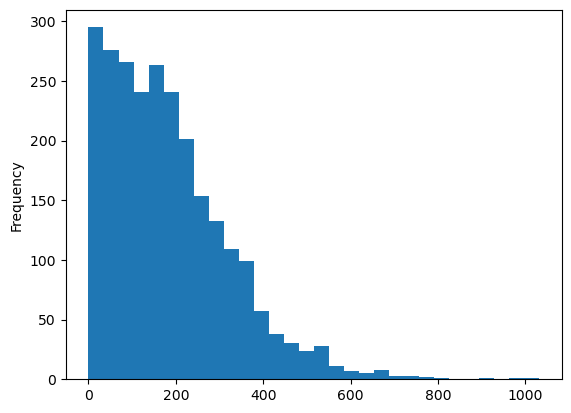

In [150]:
# I will now plot the 'Residents Paying 30% to 49% of Income on Rent' variable
# as a histogram with 30 bins
RentBurden['Residents Paying 30% to 49% of Income on Rent'].plot.hist(bins=30)

<AxesSubplot: >

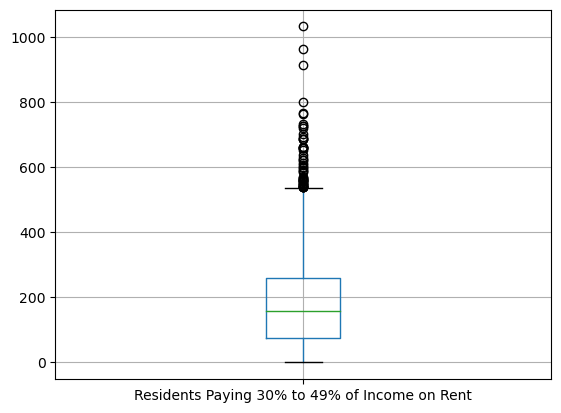

In [151]:
# I can generate a box plot for the same varible
RentBurden.boxplot(column=['Residents Paying 30% to 49% of Income on Rent'])

<AxesSubplot: xlabel='Residents Paying 30% to 49% of Income on Rent', ylabel='Renter-Occupied Housing Units'>

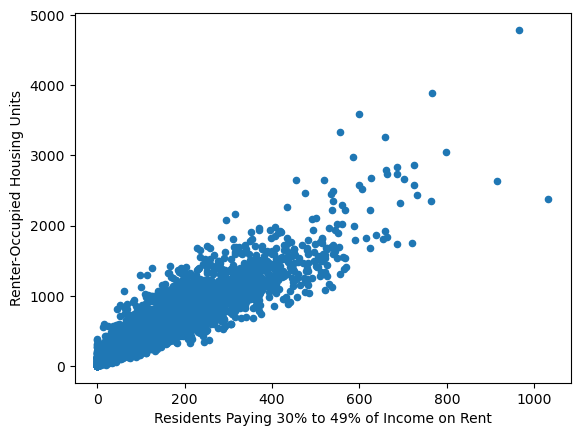

In [152]:
# For a scatterplot, I have made the x-axis 'Residents Paying 30% to 49% of Income on Rent',
# and the y-axis Renter-Occupied Housing Units'
RentBurden.plot.scatter(x='Residents Paying 30% to 49% of Income on Rent',y='Renter-Occupied Housing Units')

### Sorting the Data (Top-Down)

What are the top 10 census tracts with the most number of residents experiencing rent burden (spending 30%-49% of their incomes on rent)? We can sort the data by this column.

In [119]:
RentBurdenSorted = RentBurden.sort_values(by='Residents Paying 30% to 49% of Income on Rent',ascending = False)

In [154]:
# I have sorted the data and will display the top 10 census tracts
RentBurdenSorted[['FIPS','Residents Paying 30% to 49% of Income on Rent']].head(10)

,FIPS,Residents Paying 30% to 49% of Income on Rent
602,06037207502,1032
2278,06037702900,964
2249,06037700902,914
2264,06037701902,799
2239,06037700200,766
2036,06037576602,764
604,06037207712,732
1028,06037275604,725
2026,06037576200,725
92,06037111402,721


<AxesSubplot: xlabel='FIPS'>

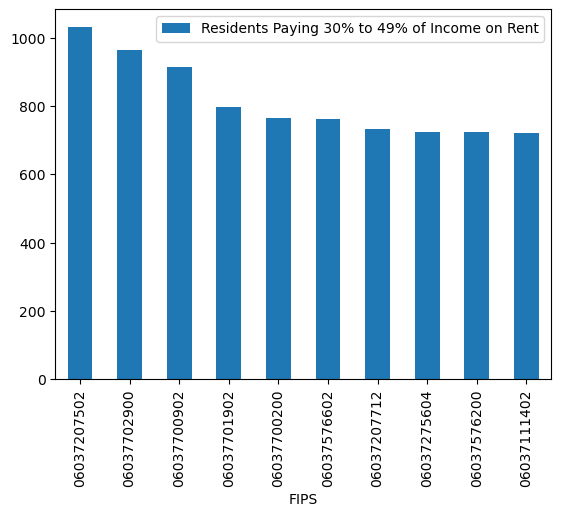

In [155]:
# I can plot these results
RentBurdenSorted.head(10).plot.bar(x='FIPS',
                            y='Residents Paying 30% to 49% of Income on Rent')

What are the top 10 census tracts with the most number of residents experiencing severe rent burden (spending 50% or more of their incomes on rent)? Again, we can sort the data by this column and plot it

In [122]:
SevereRentBurdenSorted = RentBurden.sort_values(by='Residents Paying 50% or more of Income on Rent',ascending = False)

In [123]:
SevereRentBurdenSorted[['FIPS','Residents Paying 50% or more of Income on Rent']].head(10)

,FIPS,Residents Paying 50% or more of Income on Rent
2278,06037702900,1324
2239,06037700200,1066
1124,06037301601,1065
1123,06037301502,946
319,06037134905,896
606,06037207902,858
939,06037265303,855
1142,06037302401,852
2026,06037576200,849
472,06037191000,843


<AxesSubplot: xlabel='FIPS'>

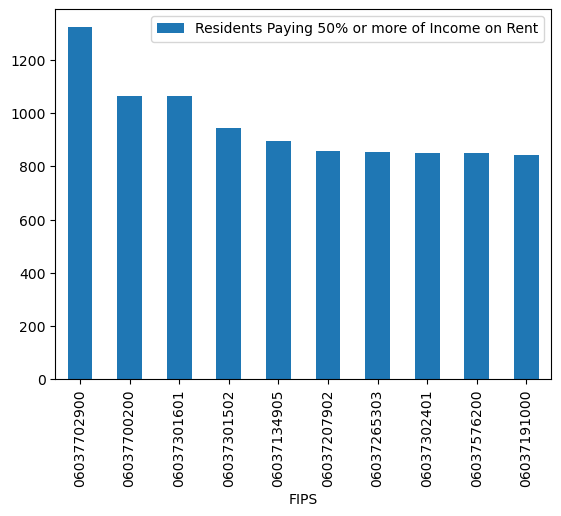

In [124]:
SevereRentBurdenSorted.head(10).plot.bar(x='FIPS',
                            y='Residents Paying 50% or more of Income on Rent')

### Mapping with Geopandas

With using Geopandas, I have found a geojson file from the Los Angeles GeoHub that shows all the census tracts in the city of Los Angeles based on the 2010 population

In [125]:
import geopandas as gpd

In [156]:
# bring in the data file that I have uploaded
LACityTracts=gpd.read_file('data/Census_Tracts_2010_Population.geojson')

In [157]:
# Open the data and check to see what the columns are
LACityTracts.head()

,OBJECTID,TRACTCE10,POP,LATPOP_D,WHIPOP_D,BLAPOP_D,AMIPOP_D,ASIPOP_D,HPIPOP_D,OTHPOP_D,...,ASIVAP_D,HPIVAP_D,OTHVAP_D,MMRVAP_D,H0010001,H0010002,H0010003,TOOLTIP,NLA_URL,geometry
0,1,101110,4731,1324,2656,74,14,486,4,30,...,396,4,22,108,1734,1641,93,Tract: 1011.10\nTotal Population: 4731,navigatela/reports/census_tracts_2010.cfm?PK=1...,"POLYGON ((-118.29420 34.26289, -118.29435 34.2..."
1,2,101122,3664,575,2437,26,4,495,1,10,...,426,1,8,81,1369,1325,44,Tract: 1011.22\nTotal Population: 3664,navigatela/reports/census_tracts_2010.cfm?PK=1...,"POLYGON ((-118.28996 34.27813, -118.28991 34.2..."
2,3,101210,5990,2219,2890,183,6,448,3,5,...,390,2,3,194,2317,2150,167,Tract: 1012.10\nTotal Population: 5990,navigatela/reports/census_tracts_2010.cfm?PK=1...,"POLYGON ((-118.29212 34.25071, -118.29191 34.2..."
3,4,101220,3363,1272,1662,36,11,272,2,3,...,219,2,2,76,1317,1246,71,Tract: 1012.20\nTotal Population: 3363,navigatela/reports/census_tracts_2010.cfm?PK=1...,"POLYGON ((-118.27946 34.24757, -118.27619 34.2..."
4,5,101300,4199,503,3190,41,5,317,3,7,...,272,2,6,94,1582,1542,40,Tract: 1013.00\nTotal Population: 4199,navigatela/reports/census_tracts_2010.cfm?PK=1...,"POLYGON ((-118.26542 34.25547, -118.26545 34.2..."


<AxesSubplot: >

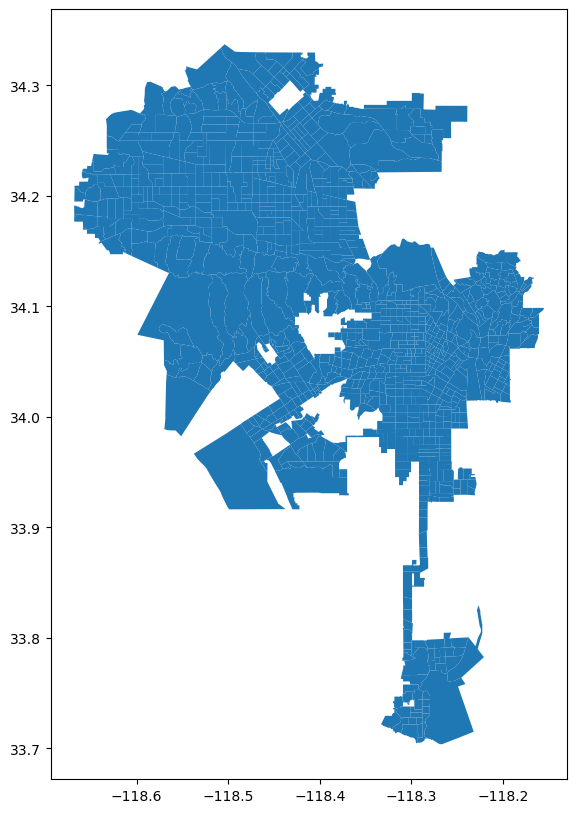

In [158]:
# Since there is a geography column, we can plot this and see how it looks
LACityTracts.plot(figsize=(12,10))

In [159]:
# I can learn more about this data set with the .info() command
LACityTracts.info(verbose=True, show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1012 entries, 0 to 1011
Data columns (total 26 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   OBJECTID   1012 non-null   int64   
 1   TRACTCE10  1012 non-null   object  
 2   POP        1012 non-null   int64   
 3   LATPOP_D   1012 non-null   int64   
 4   WHIPOP_D   1012 non-null   int64   
 5   BLAPOP_D   1012 non-null   int64   
 6   AMIPOP_D   1012 non-null   int64   
 7   ASIPOP_D   1012 non-null   int64   
 8   HPIPOP_D   1012 non-null   int64   
 9   OTHPOP_D   1012 non-null   int64   
 10  MMRPOP_D   1012 non-null   int64   
 11  VAP        1012 non-null   int64   
 12  LATVAP_D   1012 non-null   int64   
 13  WHIVAP_D   1012 non-null   int64   
 14  BLAVAP_D   1012 non-null   int64   
 15  AMIVAP_D   1012 non-null   int64   
 16  ASIVAP_D   1012 non-null   int64   
 17  HPIVAP_D   1012 non-null   int64   
 18  OTHVAP_D   1012 non-null   int64   
 19  MMRVAP_D   1012 non

In [160]:
# Since I really only care about the FIPS and geometry columns in this data,
# I can subset the data
LACityTracts = LACityTracts[['TRACTCE10','geometry']]

In [161]:
# check to see if I have the desired subset 
LACityTracts.head()

,TRACTCE10,geometry
0,101110,"POLYGON ((-118.29420 34.26289, -118.29435 34.2..."
1,101122,"POLYGON ((-118.28996 34.27813, -118.28991 34.2..."
2,101210,"POLYGON ((-118.29212 34.25071, -118.29191 34.2..."
3,101220,"POLYGON ((-118.27946 34.24757, -118.27619 34.2..."
4,101300,"POLYGON ((-118.26542 34.25547, -118.26545 34.2..."


In [163]:
# Since the 'TRACTCE10' FIPS code column currently is missing the state 
# and county code, I need to add them and create a new FIPS column
LACityTracts['FIPS'] ='06' + '037' + LACityTracts['TRACTCE10']

In [164]:
# I will check to see if the output is correct with a new FIPS column
LACityTracts.head()

,TRACTCE10,geometry,FIPS
0,101110,"POLYGON ((-118.29420 34.26289, -118.29435 34.2...",06037101110
1,101122,"POLYGON ((-118.28996 34.27813, -118.28991 34.2...",06037101122
2,101210,"POLYGON ((-118.29212 34.25071, -118.29191 34.2...",06037101210
3,101220,"POLYGON ((-118.27946 34.24757, -118.27619 34.2...",06037101220
4,101300,"POLYGON ((-118.26542 34.25547, -118.26545 34.2...",06037101300


### Merging and Joining the Data

After cleaning up my data, I have the census data from social explorer and the geo data from the Los Angeles GeoHub - with both having the correct FIPS code

In [165]:
# I will create a new dataframe based on this join
RentBurdenTracts=LACityTracts.merge(RentBurden,on="FIPS")

In [166]:
# Check to see if the merge was successful
RentBurdenTracts.head()

,TRACTCE10,geometry,FIPS,Renter-Occupied Housing Units,Residents Paying 30% to 49% of Income on Rent,Residents Paying 50% or more of Income on Rent
0,101110,"POLYGON ((-118.29420 34.26289, -118.29435 34.2...",06037101110,644,179,175
1,101122,"POLYGON ((-118.28996 34.27813, -118.28991 34.2...",06037101122,344,181,62
2,101220,"POLYGON ((-118.27946 34.24757, -118.27619 34.2...",06037101220,762,198,210
3,101300,"POLYGON ((-118.26542 34.25547, -118.26545 34.2...",06037101300,242,17,44
4,101400,"POLYGON ((-118.27236 34.23268, -118.27232 34.2...",06037101400,387,207,118


### Creating Choropleth Maps in Geopandas

Since I have three variables of interest:
- 'Renter-Occupied Housing Units'
- 'Residents Paying 30% to 49% of Income on Rent'
- 'Residents Paying 50% or more of Income on Rent'

I can create choropleth maps for each of them in geopandas, using three different color schemes - natural breaks, equal intervals, and quantiles. Each color scheme will yield different effects and visual impacts so we can later decide which scheme best conveys our data/trends in the most impactful way


<AxesSubplot: >

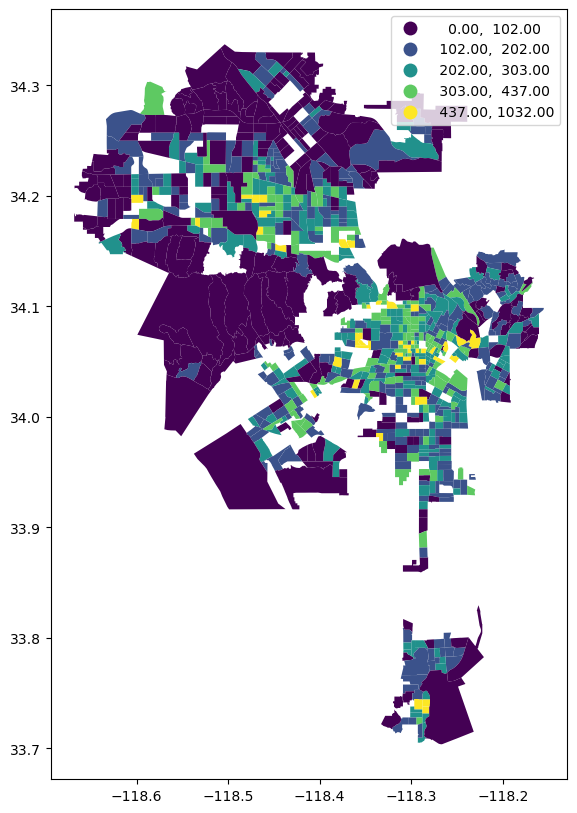

In [167]:
# Choropleth Map for 'Residents Paying 30% to 49% of Income on Rent' using the
# Natural Breaks scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 30% to 49% of Income on Rent',
                 legend=True, 
                 scheme='NaturalBreaks')

<AxesSubplot: >

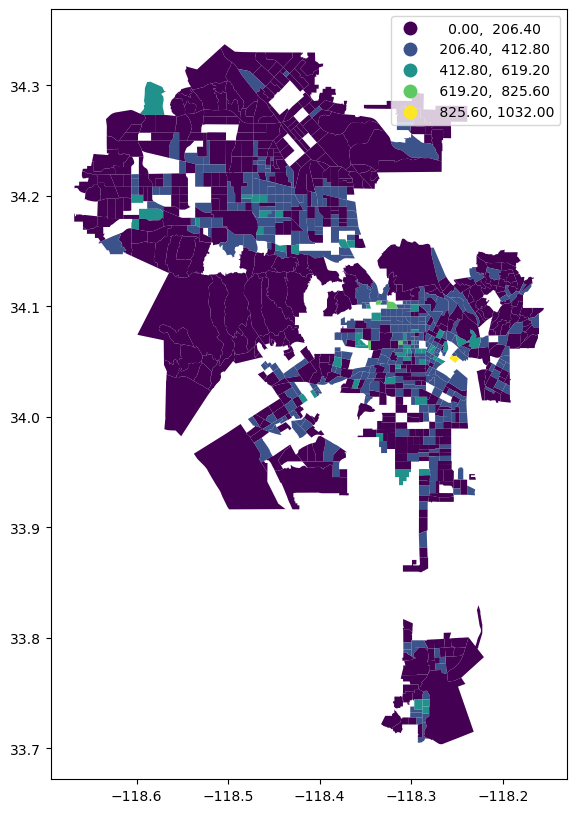

In [168]:
# Choropleth Map for 'Residents Paying 30% to 49% of Income on Rent' using the
# Equal Interval scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 30% to 49% of Income on Rent',
                 legend=True, 
                 scheme='equal_interval')

<AxesSubplot: >

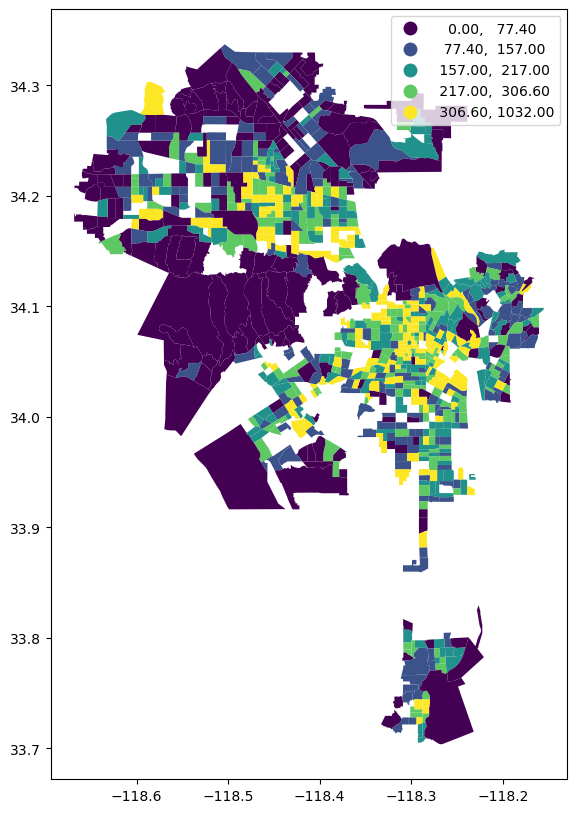

In [169]:
# Choropleth Map for 'Residents Paying 30% to 49% of Income on Rent' using the
# Quantiles scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 30% to 49% of Income on Rent',
                 legend=True, 
                 scheme='quantiles')

<AxesSubplot: >

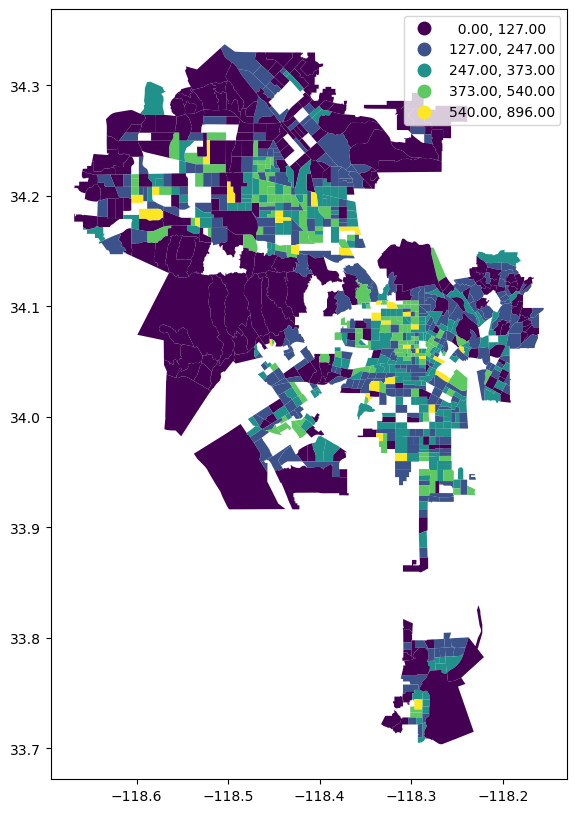

In [170]:
# Choropleth Map for 'Residents Paying 50% or more of Income on Rent' using the
# Natural Breaks scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 50% or more of Income on Rent',
                 legend=True, 
                 scheme='NaturalBreaks')

<AxesSubplot: >

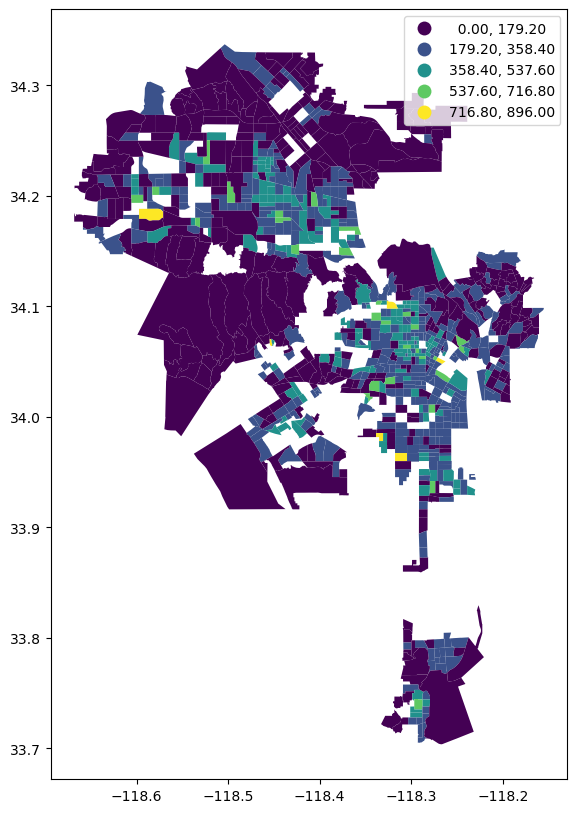

In [171]:
# Choropleth Map for 'Residents Paying 50% or more of Income on Rent' using the
# Equal Interval scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 50% or more of Income on Rent',
                 legend=True, 
                 scheme='equal_interval')

<AxesSubplot: >

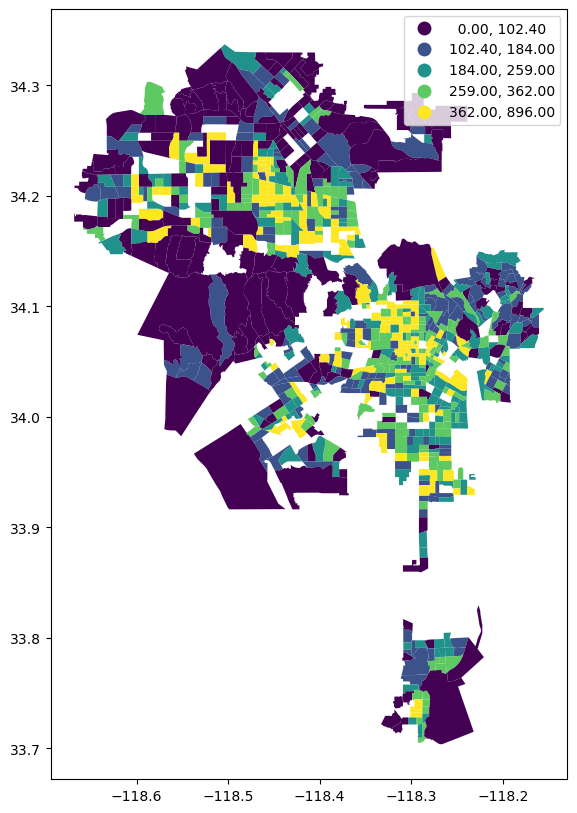

In [172]:
# Choropleth Map for 'Residents Paying 50% or more of Income on Rent' using the
# quantiles scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Residents Paying 50% or more of Income on Rent',
                 legend=True, 
                 scheme='quantiles')

<AxesSubplot: >

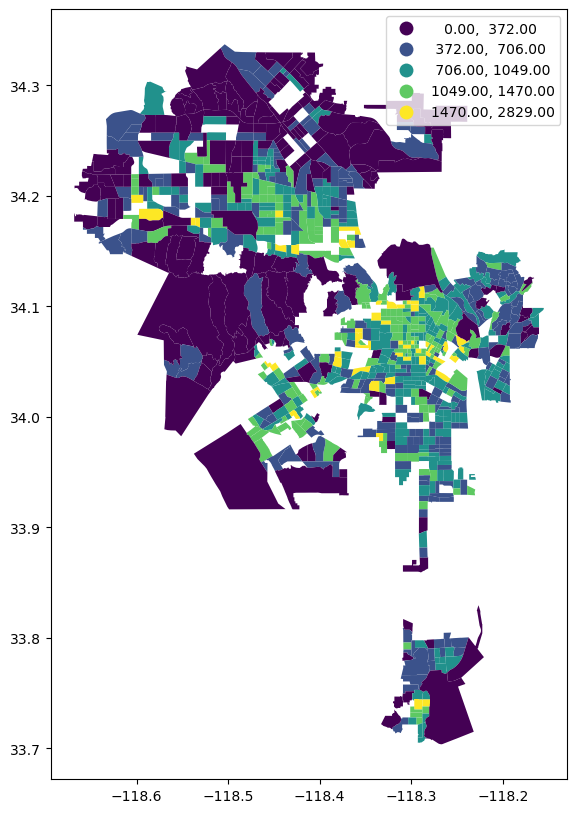

In [173]:
# Choropleth Map for 'Renter-Occupied Housing Units' using the
# Natural Breaks scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Renter-Occupied Housing Units',
                 legend=True, 
                 scheme='NaturalBreaks')

<AxesSubplot: >

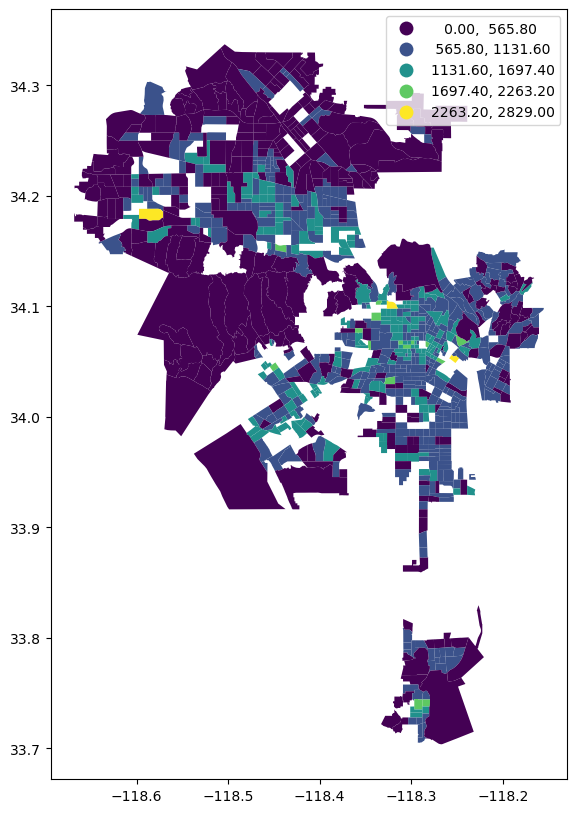

In [174]:
# Choropleth Map for 'Renter-Occupied Housing Units' using the
# Equal Interval scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Renter-Occupied Housing Units',
                 legend=True, 
                 scheme='equal_interval')

<AxesSubplot: >

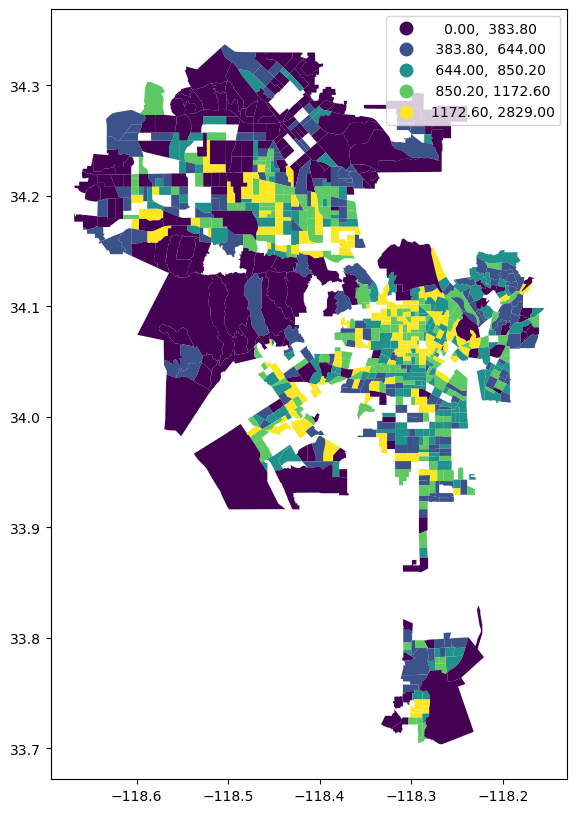

In [175]:
# Choropleth Map for 'Renter-Occupied Housing Units' using the
# quantiles scheme
RentBurdenTracts.plot(figsize=(12,10),
                 column='Renter-Occupied Housing Units',
                 legend=True, 
                 scheme='quantiles')

### Creating an Interactive Map with Folium

In [90]:
import folium

In [176]:
# Create the base map
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [179]:
# Plotting the rent burden choropleth over the base map
# I am using the 'Residents Paying 50% or more of Income on Rent' variable
folium.Choropleth(
                  geo_data=LACityTracts, 
                  data=RentBurden,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'Residents Paying 50% or more of Income on Rent'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Number of Residents Paying 50% or more of Income on Rent').add_to(m)
m

In [96]:
m.save('LACensusTracts_RentBurden.html')

I am not sure what exactly went wrong with the folium choropleth map since it shows some census tracts in the city of Los Angeles as black. Overall, you can see the areas of darker blue and purple as the census tracts with the higher number of residetns who pay 50% or more of their income on rent.